In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sys
import os

from pathlib import Path

# Agregar ruta del proyecto
sys.path.insert(0, str(Path.cwd()))

from experiment import (
    load_bootstrap_representations,
    load_target_representations,
    load_basic_representations
)
from model import MetaFeatX, get_cost_matrix, get_ndcg_score
from sklearn.metrics import pairwise_distances

print("✓ Todas las librerías importadas correctamente")

✓ Todas las librerías importadas correctamente


In [ ]:

def get_model_representations(cfg, basic_reprs, target_reprs, list_ids, train_ids, test_ids, alpha, lambda_reg):
    basic_reprs["boostrap"] = 0

    bootstrap_reprs = load_bootstrap_representations(metafeature=cfg.metafeature, path=cfg.data_path)

    print(bootstrap_reprs.shape)
    bootstrap_reprs = bootstrap_reprs[bootstrap_reprs.task_id.isin(list_ids)]

    
    bootstrap_reprs["boostrap"] = 1

    print(bootstrap_reprs.shape)

    combined_basic_reprs = pd.concat([basic_reprs, bootstrap_reprs], axis=0)

    print(combined_basic_reprs.shape)

    
    combined_basic_reprs = pd.concat([
        combined_basic_reprs[combined_basic_reprs.task_id.isin(train_ids)],
        combined_basic_reprs[combined_basic_reprs.task_id.isin(test_ids)]
    ], axis=0)

    print(combined_basic_reprs.shape)
    

    model = MetaFeatX(alpha= alpha,
                    lambda_reg=lambda_reg,
                    learning_rate=0.01,
                    early_stopping_patience=20,
                    early_stopping_criterion_ndcg=cfg.task.ndcg,
                    verbose=False,
                    seed=cfg.seed)
    repr_train, repr_test = model.train_and_predict(
        basic_reprs=combined_basic_reprs.drop(["boostrap"], axis=1),
        target_reprs=target_reprs,
        column_id="task_id",
        train_ids=train_ids,
        test_ids=test_ids
    )

    print(repr_train.shape, repr_test.shape)
    print(repr_train)
    print(repr_test)

    model_reprs = np.concatenate([repr_train, repr_test], axis=0)
    print(model_reprs.shape)
    model_reprs = pd.DataFrame(model_reprs, columns=[f"col{_}" for _ in range(model_reprs.shape[1])])
    print(model_reprs.shape)
    model_reprs["task_id"] = combined_basic_reprs["task_id"].values
    model_reprs["boostrap"] = combined_basic_reprs["boostrap"].values
    print(model_reprs.shape)
    return model_reprs[model_reprs.boostrap == 0].drop(["boostrap"], axis=1)


In [ ]:

def run_task1(cfg, alpha, lambda_reg):
    target_reprs = load_target_representations(pipeline=cfg.pipeline, path=cfg.data_path)
    list_ids = sorted(list(target_reprs["task_id"].unique()))

    if cfg.openml_tid not in list_ids:
        raise Exception(f"OpenML task {cfg.openml_tid} does not have target representations.")

    basic_reprs = load_basic_representations(metafeature=cfg.metafeature, path=cfg.data_path)
    basic_reprs = basic_reprs[basic_reprs.task_id.isin(list_ids)]

    if cfg.metafeature.name == "metabu":
        train_ids = [_ for _ in list_ids if _ != cfg.openml_tid]
        test_ids = [cfg.openml_tid]

        basic_reprs = get_model_representations(cfg, basic_reprs, target_reprs, list_ids, train_ids, test_ids, alpha, lambda_reg)

    basic_reprs = basic_reprs.set_index("task_id")
    print(basic_reprs)

    true_dist = get_cost_matrix(target_repr=target_reprs, task_ids=list_ids, verbose=False)
    print(true_dist.shape)
    print(true_dist)
    pred_dist = pairwise_distances(basic_reprs.loc[list_ids])

    print(pred_dist)
    print(pred_dist.shape)

    id_test = list_ids.index(cfg.openml_tid)

    print("Task 1: \n- pipeline: {0} \n- Metafeature: {1} \n- OpenML task: {3} \n- NDCG@{2}: {4}".format(
        cfg.pipeline.name,
        cfg.metafeature.name,
        cfg.task.ndcg,
        cfg.openml_tid,
        get_ndcg_score(dist_pred=np.array([pred_dist[id_test]]), dist_true=np.array([true_dist[id_test]]),
                       k=cfg.task.ndcg)
    ))


    return get_ndcg_score(dist_pred=np.array([pred_dist[id_test]]), dist_true=np.array([true_dist[id_test]]),
                       k=cfg.task.ndcg)

    

In [ ]:

# Lista de datsets usados
datasets_has_priors = [
    3, 6, 11, 12, 14, 15, 16, 18, 22, 23, 28, 29, 31, 32, 37, 43, 45, 49,
    53, 219, 2074, 2079, 3021, 3022, 3481, 3549, 3560, 3573, 3902, 3903,
    3904, 3913, 3917, 3918, 7592, 9910, 9946, 9952, 9957, 9960, 9964, 9971,
    9976, 9977, 9978, 9981, 9985, 10093, 10101, 14952, 14954, 14965, 14969,
    14970, 125920, 125922, 146195, 146800, 146817, 146819, 146820, 146821,
    146824, 167125
]
assert len(datasets_has_priors) == 64

    


In [ ]:
import os
from omegaconf import OmegaConf


config_base_path = "./conf"       
pipeline_name = "adaboost"        
metafeature_name = "metabu"       
sklearn_name = "autosklearn"       
task_name = "task1"               


# Config general
config_yaml = os.path.join(config_base_path, "config.yaml")
cfg_main = OmegaConf.load(config_yaml)

# Pipeline
pipeline_yaml = os.path.join(config_base_path, "pipeline", f"{pipeline_name}.yaml")
cfg_pipeline = OmegaConf.load(pipeline_yaml)

# Metafeature
metafeature_yaml = os.path.join(config_base_path, "metafeature", f"{metafeature_name}.yaml")
cfg_metafeature = OmegaConf.load(metafeature_yaml)

sklearn_yaml = os.path.join(config_base_path, "metafeature", f"{sklearn_name}.yaml")
cfg_sklearn = OmegaConf.load(sklearn_yaml)

# Task
task_yaml = os.path.join(config_base_path, "task", f"{task_name}.yaml")
cfg_task = OmegaConf.load(task_yaml)


def compute(dataset,alpha, lambda_reg, meta):

    if meta == "metabu":
        cfg_metafeature_use = cfg_metafeature
    else:
        cfg_metafeature_use = cfg_sklearn

    cfg = OmegaConf.create({
        "seed": cfg_main.get("seed", 42),
        "pipeline": cfg_pipeline,
        "metafeature": cfg_metafeature_use,
        "task": cfg_task,
        "openml_tid": cfg_main.get("openml_tid", dataset),
        "data_path": cfg_main.get("data_path", "./data_metabu_iclr"),
        "output_file": cfg_main.get("output_file", None)
    })


    return run_task1(cfg, alpha, lambda_reg)

In [ ]:

alphas = [0.1, 0.3, 0.5, 0.7, 0.99]
lambdas = [1e-1, 1e-2, 1e-3, 1e-4]
seed = 42
data_path = "data_metabu_iclr"
pipeline_name = "adaboost"
metafeature_name = "metafeatx"


heatmap = np.zeros((len(alphas), len(lambdas)))

for i, alpha in enumerate(alphas):
    for j, lambda_reg in enumerate(lambdas):
        diffs = []
        for dataset in datasets_has_priors:
            ndcg_model = compute(dataset, alpha, lambda_reg,"metafeatx")

            print(ndcg_model)
            # Cambiar metafeature a 'autosklearn' para la comparación
            ndcg_autosklearn = compute(dataset, alpha, lambda_reg, "autosklearn")  # ajustar si tienes otra función

            print(ndcg_autosklearn)
            diffs.append(ndcg_model - ndcg_autosklearn)
        heatmap[i, j] = np.mean(diffs)


(72000, 136)
(64000, 137)
(64064, 137)
(64064, 137)
(63063, 2) (1001, 2)
[[-0.42488975 -2.10983147]
 [ 1.43394496  1.53630266]
 [ 0.99407238 -0.82428244]
 ...
 [-0.38735132 -0.28879662]
 [-0.26903514 -0.29530052]
 [-0.35269222 -0.2051197 ]]
[[0.19701614 0.06563315]
 [0.20190983 0.0828692 ]
 [0.204548   0.08535432]
 ...
 [0.2020718  0.07640186]
 [0.19515606 0.10799383]
 [0.19854287 0.08364704]]
(64064, 2)
(64064, 2)
(64064, 4)
             col0      col1
task_id                    
6       -0.424890 -2.109831
11       1.433945  1.536303
12       0.994072 -0.824282
14       0.601612 -0.833287
15       1.059745  0.819877
...           ...       ...
146820   1.031216  0.517595
146821   0.735392  0.037870
146824   0.718153 -0.993585
167125  -0.412335 -0.289267
3        0.197016  0.065633

[64 rows x 2 columns]
(64, 64)
[[0.         0.61319786 0.53382488 ... 0.35828388 0.39133794 0.26152645]
 [0.61319786 0.         0.96215596 ... 0.40605247 0.22963672 0.51576673]
 [0.53382488 0.96215596 0.  

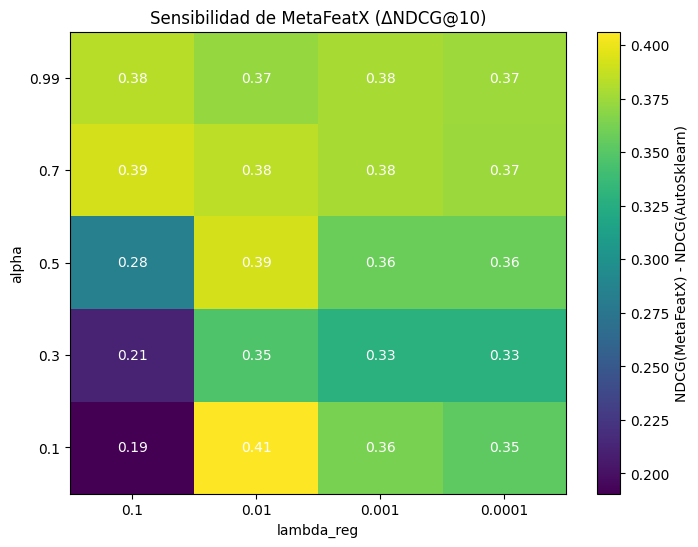

In [25]:
plt.figure(figsize=(8,6))
im = plt.imshow(heatmap, cmap="viridis", origin="lower", aspect="auto")

plt.xticks(np.arange(len(lambdas)), lambdas)
plt.yticks(np.arange(len(alphas)), alphas)
plt.xlabel("lambda_reg")
plt.ylabel("alpha")
plt.title("Sensibilidad de MetaFeatX (ΔNDCG@10)")
plt.colorbar(im, label="NDCG(MetaFeatX) - NDCG(AutoSklearn)")

# Mostrar los valores en cada celda
for i in range(len(alphas)):
    for j in range(len(lambdas)):
        plt.text(j, i, f"{heatmap[i,j]:.2f}", ha="center", va="center", color="white")

plt.show()